In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import sys
from pathlib import Path

script_dir = (Path.cwd().parents[0]/'Zd_visualizations_for_val').resolve()
script_dir, script_dir.exists()

(PosixPath('/mnt/trappist-r0/cmarshak/dist-s1-research/marshak/Zd_visualizations_for_val'),
 True)

In [3]:
sys.path.insert(0, str(script_dir))

import json
from rasterize import rasterize_shapes_to_array
import pandas as pd
import geopandas as gpd
import rasterio
import matplotlib.pyplot as plt
import numpy as np
from dist_plot import get_dist_s1_mpl_cmap
from earthaccess_utils import earthaccess_opera_geo_search, flatten_earthaccess_result, read_multiple_earthdata_urls, convert_asf_url_to_cumulus
from dist_s1.constants import DIST_STATUS_CMAP
from dist_plot import add_dist_s1_colorbar
from distmetrics.despeckle import despeckle_rtc_arrs_with_tv
from shapely.geometry import box
from matplotlib.colors import ListedColormap, BoundaryNorm
from rasterio.plot import show
from basemaps import get_basemap_for_matplotlib, get_basemap_for_rasterio
from dist_s1_enumerator import get_mgrs_burst_lut
from tqdm import tqdm
import img2pdf
from matplotlib.lines import Line2D
from dist_s1.data_models.data_utils import get_acquisition_datetime, get_track_number, get_burst_id
from dotenv import load_dotenv
import os
from dist_s1_enumerator import enumerate_one_dist_s1_product
from dem_stitcher.rio_window import read_raster_from_window
from wand.image import Image
from rasterio.plot import show


/mnt/trappist-r0/cmarshak/mambaforge/envs/dist-s1-env/lib/python3.13/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [4]:
df_event_meta = pd.read_parquet('/mnt/trappist-r0/cmarshak/dist-s1-events/event_metadata.parquet')
df_event_meta.head()


,event_name,event_date,mgrs_tiles,source_id,links
0,porto_alegre_flood_2024,2024-05-28,"[22JDM, 22JDN]",EMSN194_STD_AOI01_P04FLDEL01_FloodExtent_v01,[https://mapping.emergency.copernicus.eu/activ...
1,chiapas_fire_2024,2024-03-24,[15QUU],Copernicus EMSR717,[data: https://rapidmapping.emergency.copernic...
2,yajiang_fire_2024,2024-03-15,"[47RQP, 47RPP]",UNOSAT via humanitarian data exchange,[https://data.humdata.org/dataset/the-wildfire...
3,bangladesh_coastal_flood_2024,2024-07-08,"[45QYE, 45QYF, 45QZE, 45QZF]",UNOSAT via humanitarian data exchange ST1_2024...,[https://data.humdata.org/dataset/satellite-de...
4,park_fire_2024,2024-07-24,"[10TEK, 10TFK]",WFIGS Park Fire 2024,[https://en.wikipedia.org/wiki/Park_Fire]


In [5]:
sorted(df_event_meta.event_name.tolist())

['afghanistan_flood_2024',
 'attica_fire_2024',
 'bangladesh_coastal_flood_2024',
 'bioko_fire_2024',
 'brazzaville_flood_and_landslides_2023',
 'brazzaville_flood_and_landslides_2024',
 'chiapas_fire_2024',
 'chilcotin_river_landslide_and_flood_2024',
 'chile_fire_2024',
 'cipongkor_landslides_2024',
 'demak_flood_2024',
 'durkee_fire_2024',
 'hokkaido_landslides_2018',
 'los_angeles_fires_2025',
 'mai_mahiu_flood_and_landslides_2024',
 'monkey_creek_fire_2024',
 'papau_new_guinea_landslide_2024',
 'park_fire_2024',
 'porto_alegre_flood_2024',
 'smokehouse_creek_fire_2024',
 'southwest_france_flood_2023',
 'tlacotalpan_flood_2024',
 'tuscany_flood_2023',
 'yajiang_fire_2024']

# Parameters

In [47]:
EVENT_ID = 'chile_fire_2024'
DELAY_IN_DAYS = 14 if 'flood' not in EVENT_ID else 0

In [48]:
assert EVENT_ID in df_event_meta.event_name.unique()

In [49]:
df_event_perimeters = gpd.read_parquet('/mnt/trappist-r0/cmarshak/dist-s1-events/event_perimeters.parquet')
df_event_perimeters.head()


,event_name,geometry
0,porto_alegre_flood_2024,"MULTIPOLYGON (((-51.26193 -30.11187, -51.26189..."
1,chiapas_fire_2024,"MULTIPOLYGON (((-94.53702 16.47015, -94.53692 ..."
2,yajiang_fire_2024,"MULTIPOLYGON (((101.0631 30.05153, 101.06069 3..."
3,bangladesh_coastal_flood_2024,GEOMETRYCOLLECTION (POLYGON ((88.98224 22.4023...
4,park_fire_2024,"MULTIPOLYGON (((-121.93048 39.97492, -121.9296..."


In [50]:
df_event_extent = gpd.read_parquet('/mnt/trappist-r0/cmarshak/dist-s1-events/event_extents.parquet')
df_event_extent.head()

,event_name,geometry
0,porto_alegre_flood_2024,"POLYGON ((-51.30343 -29.95234, -51.2804 -29.92..."
1,chiapas_fire_2024,"MULTIPOLYGON (((-94.31275 16.38016, -94.40695 ..."
2,yajiang_fire_2024,"POLYGON ((101.01498 30.01431, 101.01199 30.013..."
3,bangladesh_coastal_flood_2024,"MULTIPOLYGON (((89.257 21.69672, 89.25796 21.6..."
4,park_fire_2024,"POLYGON ((-120.99504 39.27108, -120.99504 40.8..."


In [51]:
load_dotenv()
DIST_S1_DATA_DIR = Path(os.getenv("DIST_EVENT_DATA"))
DIST_S1_DATA_DIR.name

'confirmed_products_dist-event-nov'

In [52]:
df_perim = df_event_perimeters[df_event_perimeters.event_name == EVENT_ID].reset_index(drop=True)
df_extent = df_event_extent[df_event_extent.event_name == EVENT_ID].reset_index(drop=True)
df_meta = df_event_meta[df_event_meta.event_name == EVENT_ID].reset_index(drop=True)

In [53]:
event_time = pd.to_datetime(df_meta.event_date.iloc[0], utc=True)
event_time


Timestamp('2024-02-04 00:00:00+0000', tz='UTC')

In [54]:
event_dist_s1_dirs = [d.name for d in (DIST_S1_DATA_DIR.glob('*/'))]
event_dist_s1_dirs[:3]

['afghanistan_flood_2024__42SWF__2024-05-11',
 'attica_fire_2024__34SGH__2024-08-11',
 'bangladesh_coastal_flood_2024__45QYE__2024-07-08']

In [55]:
EVENT_DIR_NAME = [dn for dn in event_dist_s1_dirs if EVENT_ID in dn][0]
EVENT_DIR = DIST_S1_DATA_DIR / EVENT_DIR_NAME
EVENT_DIR.exists()

True

In [56]:
status_files = sorted(Path(f'{EVENT_DIR}').rglob('OPERA*GEN-DIST-STATUS.tif'))
status_files[:3]

[PosixPath('/mnt/trappist-r0/cmarshak/opera-dist-s1-validation-data/events/confirmed_products_dist-event-nov/chile_fire_2024__19HBD__2024-02-04/19HBD/OPERA_L3_DIST-ALERT-S1_T19HBD_20240109T100431Z_20251114T013938Z_S1A_30_v0.1/OPERA_L3_DIST-ALERT-S1_T19HBD_20240109T100431Z_20251114T013938Z_S1A_30_v0.1_GEN-DIST-STATUS.tif'),
 PosixPath('/mnt/trappist-r0/cmarshak/opera-dist-s1-validation-data/events/confirmed_products_dist-event-nov/chile_fire_2024__19HBD__2024-02-04/19HBD/OPERA_L3_DIST-ALERT-S1_T19HBD_20240111T232837Z_20251114T013902Z_S1A_30_v0.1/OPERA_L3_DIST-ALERT-S1_T19HBD_20240111T232837Z_20251114T013902Z_S1A_30_v0.1_GEN-DIST-STATUS.tif'),
 PosixPath('/mnt/trappist-r0/cmarshak/opera-dist-s1-validation-data/events/confirmed_products_dist-event-nov/chile_fire_2024__19HBD__2024-02-04/19HBD/OPERA_L3_DIST-ALERT-S1_T19HBD_20240116T233646Z_20251114T012228Z_S1A_30_v0.1/OPERA_L3_DIST-ALERT-S1_T19HBD_20240116T233646Z_20251114T012228Z_S1A_30_v0.1_GEN-DIST-STATUS.tif')]

In [57]:
acq_files = sorted(Path(f'{EVENT_DIR}').rglob('OPERA*GEN-DIST-STATUS-ACQ.tif'))
acq_files[:3]

[PosixPath('/mnt/trappist-r0/cmarshak/opera-dist-s1-validation-data/events/confirmed_products_dist-event-nov/chile_fire_2024__19HBD__2024-02-04/19HBD/OPERA_L3_DIST-ALERT-S1_T19HBD_20240109T100431Z_20251114T013938Z_S1A_30_v0.1/OPERA_L3_DIST-ALERT-S1_T19HBD_20240109T100431Z_20251114T013938Z_S1A_30_v0.1_GEN-DIST-STATUS-ACQ.tif'),
 PosixPath('/mnt/trappist-r0/cmarshak/opera-dist-s1-validation-data/events/confirmed_products_dist-event-nov/chile_fire_2024__19HBD__2024-02-04/19HBD/OPERA_L3_DIST-ALERT-S1_T19HBD_20240111T232837Z_20251114T013902Z_S1A_30_v0.1/OPERA_L3_DIST-ALERT-S1_T19HBD_20240111T232837Z_20251114T013902Z_S1A_30_v0.1_GEN-DIST-STATUS-ACQ.tif'),
 PosixPath('/mnt/trappist-r0/cmarshak/opera-dist-s1-validation-data/events/confirmed_products_dist-event-nov/chile_fire_2024__19HBD__2024-02-04/19HBD/OPERA_L3_DIST-ALERT-S1_T19HBD_20240116T233646Z_20251114T012228Z_S1A_30_v0.1/OPERA_L3_DIST-ALERT-S1_T19HBD_20240116T233646Z_20251114T012228Z_S1A_30_v0.1_GEN-DIST-STATUS-ACQ.tif')]

In [58]:
metric_files = sorted(Path(f'{EVENT_DIR}').rglob('OPERA*GEN-METRIC.tif'))
metric_files[:3]

[PosixPath('/mnt/trappist-r0/cmarshak/opera-dist-s1-validation-data/events/confirmed_products_dist-event-nov/chile_fire_2024__19HBD__2024-02-04/19HBD/OPERA_L3_DIST-ALERT-S1_T19HBD_20240109T100431Z_20251114T013938Z_S1A_30_v0.1/OPERA_L3_DIST-ALERT-S1_T19HBD_20240109T100431Z_20251114T013938Z_S1A_30_v0.1_GEN-METRIC.tif'),
 PosixPath('/mnt/trappist-r0/cmarshak/opera-dist-s1-validation-data/events/confirmed_products_dist-event-nov/chile_fire_2024__19HBD__2024-02-04/19HBD/OPERA_L3_DIST-ALERT-S1_T19HBD_20240111T232837Z_20251114T013902Z_S1A_30_v0.1/OPERA_L3_DIST-ALERT-S1_T19HBD_20240111T232837Z_20251114T013902Z_S1A_30_v0.1_GEN-METRIC.tif'),
 PosixPath('/mnt/trappist-r0/cmarshak/opera-dist-s1-validation-data/events/confirmed_products_dist-event-nov/chile_fire_2024__19HBD__2024-02-04/19HBD/OPERA_L3_DIST-ALERT-S1_T19HBD_20240116T233646Z_20251114T012228Z_S1A_30_v0.1/OPERA_L3_DIST-ALERT-S1_T19HBD_20240116T233646Z_20251114T012228Z_S1A_30_v0.1_GEN-METRIC.tif')]

In [59]:
dist_s1_dates = list(map(get_acquisition_datetime, metric_files))
dist_s1_dates[:10]

[Timestamp('2024-01-09 10:04:31+0000', tz='UTC'),
 Timestamp('2024-01-11 23:28:37+0000', tz='UTC'),
 Timestamp('2024-01-16 23:36:46+0000', tz='UTC'),
 Timestamp('2024-01-21 10:04:30+0000', tz='UTC'),
 Timestamp('2024-01-23 23:28:36+0000', tz='UTC'),
 Timestamp('2024-01-28 23:36:46+0000', tz='UTC'),
 Timestamp('2024-02-02 10:04:30+0000', tz='UTC'),
 Timestamp('2024-02-04 23:28:36+0000', tz='UTC'),
 Timestamp('2024-02-09 23:36:45+0000', tz='UTC'),
 Timestamp('2024-02-14 10:04:29+0000', tz='UTC')]

In [60]:
post_delay_dt = event_time + pd.Timedelta(days=DELAY_IN_DAYS)
post_delay_dt

Timestamp('2024-02-18 00:00:00+0000', tz='UTC')

In [61]:
if 'los_angeles_fires_2025' in EVENT_ID:
    post_idx = 15
elif 'chile_fire_2024' in EVENT_ID:
    post_idx = 12
elif 'papau_new_guinea_landslide_2024' in EVENT_ID:
    post_idx = 9
elif 'chilcotin_river_landslide_and_flood_2024' in EVENT_ID:
    post_idx = 5
elif 'porto_alegre_flood_2024' in EVENT_ID:
    post_idx = 2
elif 'tlacotalpan_flood_2024' in EVENT_ID:
    post_idx = 8
elif 'hokkaido_landslides_2018' in EVENT_ID:
    post_idx = 17
else:
    post_idx = [idx for idx, dt in enumerate(dist_s1_dates) if dt > post_delay_dt][0]
post_idx

12

In [62]:
if 'los_angeles_fires_2025' in EVENT_ID:
    pre_idx = 3
elif 'chilcotin_river_landslide_and_flood_2024' in EVENT_ID:
    pre_idx = 2
elif 'tlacotalpan_flood_2024' in EVENT_ID:
    pre_idx = 4
else:
    pre_idx = [idx for idx, dt in enumerate(dist_s1_dates) if dt < event_time - pd.Timedelta(days=12)][-1]
pre_idx

3

In [63]:
def read_one(path: Path):
    with rasterio.open(path) as ds:
        arr = ds.read(1)
        p = ds.profile
    return arr, p

metric_arr_pre, p = read_one(metric_files[pre_idx])
metric_arr_post, _ = read_one(metric_files[post_idx])

In [64]:
df_extent_utm = df_extent.to_crs(p['crs'])
df_perim_utm = df_perim.to_crs(p['crs'])

In [65]:
valid_data_mask = rasterize_shapes_to_array(df_extent_utm.geometry.tolist(), [1], p, all_touched=True)
gt_post = rasterize_shapes_to_array(df_perim_utm.geometry.tolist(), [1], p, all_touched=True)
gt_pre = np.zeros_like(valid_data_mask)

In [66]:
metric_stack = np.stack([metric_arr_pre, metric_arr_post], axis=0)
gt_stack = np.stack([gt_pre, gt_post], axis=0)
valid_data_mask_stack = np.stack([valid_data_mask, valid_data_mask], axis=0)

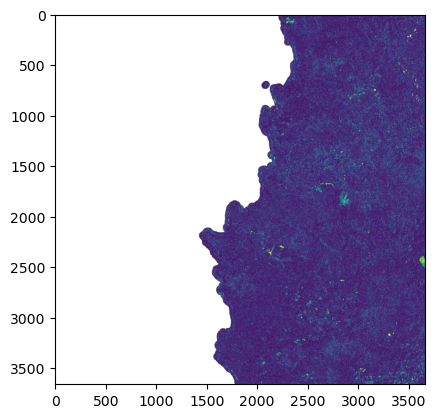

In [67]:
plt.imshow(metric_stack[0, ...], vmin=0, vmax=6)

In [68]:
# plt.imshow(metric_stack[1, ...], vmin=0, vmax=5)

In [69]:
# plt.imshow(metric_stack[1, ...] > 2.5)

In [70]:
# plt.imshow(gt_stack[1, ...])

In [71]:
# plt.imshow(valid_data_mask_stack[1, ...], vmin=0, vmax=1)

In [72]:
ts = np.linspace(0, 10, 10 * 10)

In [73]:
from sklearn.metrics import f1_score
def get_dist_labels(metric_arr, valid_data_mask, T):
    arr = np.zeros_like(metric_arr, dtype=np.uint8)
    arr[metric_arr > T] = 1
    arr_flat = arr[valid_data_mask]
    return arr_flat
f1s = [f1_score(gt_stack[valid_data_mask_stack.astype(bool)], get_dist_labels(metric_stack, valid_data_mask_stack.astype(bool), t), zero_division=0) for t in tqdm(ts)]


  0%|          | 0/100 [00:00<?, ?it/s]

100%|██████████| 100/100 [00:17<00:00,  5.56it/s]


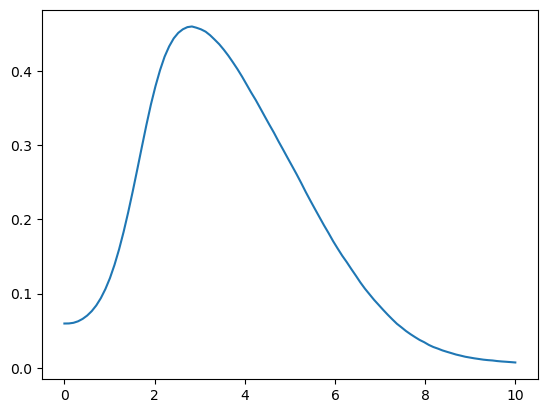

In [74]:
plt.plot(ts, f1s)

In [75]:
from sklearn.metrics import fbeta_score

fh = [fbeta_score(gt_stack[valid_data_mask_stack.astype(bool)], get_dist_labels(metric_stack, valid_data_mask_stack.astype(bool), t), beta=0.5, zero_division=0) for t in tqdm(ts)]

  0%|          | 0/100 [00:00<?, ?it/s]

100%|██████████| 100/100 [00:17<00:00,  5.60it/s]


In [76]:
# plt.plot(ts, fh)

In [77]:
out_dir = Path(f'out_{DIST_S1_DATA_DIR.name}')
f1_dir = out_dir / 'f1_events'
f1_dir.mkdir(exist_ok=True, parents=True)


f1_event = f1_dir / EVENT_ID
f1_event.mkdir(exist_ok=True, parents=True)

f1_event_pngs = f1_event / 'pngs'
f1_event_pngs.mkdir(exist_ok=True, parents=True)


In [78]:
def calculate_width_at_percent(thresholds, f1_scores, percentage=0.85, symmetric=False):
    max_f1 = np.max(f1_scores)
    target_value = max_f1 * percentage
    
    indices_above = np.where(f1_scores >= target_value)[0]
    
    if len(indices_above) < 2:
        return None, None

    first_idx = indices_above[0]
    last_idx = indices_above[-1]
    
    t_left = np.interp(target_value, f1_scores[:first_idx+1], thresholds[:first_idx+1])
    
    t_right = np.interp(target_value, f1_scores[last_idx:][::-1], thresholds[last_idx:][::-1])

    t_max = thresholds[np.argmax(f1_scores)]

    if symmetric:
        delta_t_left = t_max - t_left
        delta_t_right = t_right - t_max

        delta = min(delta_t_left, delta_t_right)

        t_left = t_max - delta
        t_right = t_max + delta
    
    return t_left, t_right

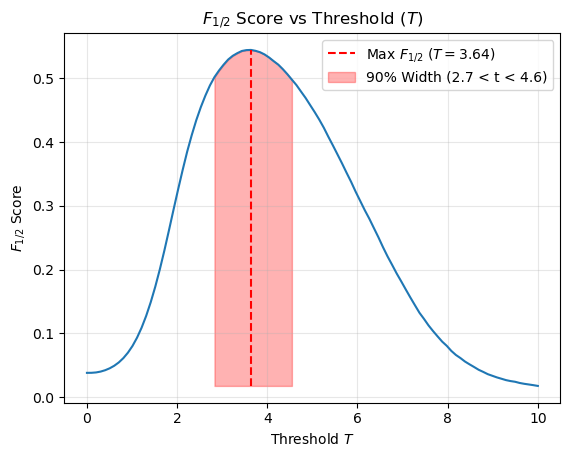

In [79]:
fig, ax = plt.subplots()
ax.plot(ts, fh)
ax.set_xlabel('Threshold $T$')
ax.set_ylabel('$F_{1/2}$ Score')
ax.grid(True, alpha=0.3)

t_l, t_h = calculate_width_at_percent(ts, fh, percentage=0.9)

max_fh_idx = np.argmax(fh)
min_fh, max_fh = np.min(fh), np.max(fh)
ax.vlines(ts[max_fh_idx], min_fh, max_fh, color='red', linestyle='--', label='Max $F_{1/2}$ ($T = $' + f'{ts[max_fh_idx]:.2f})')

# Fill under the curve between t_l and t_h
mask = (ts >= t_l) & (ts <= t_h)
ax.fill_between(ts[mask], min_fh, np.array(fh)[mask], color='red', alpha=0.3, label=f'90% Width ({t_l:1.2} < t < {t_h:1.2})')

ax.set_title('$F_{1/2}$ Score vs Threshold ($T$)')
ax.legend()

In [80]:
with rasterio.open(metric_files[pre_idx]) as ds:
    xmin_metric, ymin_metric, xmax_metric, ymax_metric = ds.bounds

In [ ]:
fs = fh

def plot_f1_and_threshold(t: float):
    # Get image bounds
    xmin_extent, ymin_extent, xmax_extent, ymax_extent = df_extent_utm.geometry.buffer(.25).total_bounds
    xmin = max(xmin_metric, xmin_extent)
    xmax = min(xmax_metric, xmax_extent)
    ymin = max(ymin_metric, ymin_extent)
    ymax = min(ymax_metric, ymax_extent)
    img_width = xmax - xmin
    img_height = ymax - ymin
    
    # Set a target height in inches for images
    img_height_inches = 5
    img_width_inches = img_height_inches * (img_width / img_height)
    
    # F1 plot can be square-ish
    f1_width_inches = img_height_inches * 0.9
    
    total_width = f1_width_inches + 2 * img_width_inches + 1.0  # padding
    
    fig, axes = plt.subplots(1, 3, figsize=(total_width, img_height_inches),
                              layout='constrained',
                              gridspec_kw={'width_ratios': [f1_width_inches, img_width_inches, img_width_inches]},
                              # dpi=1_000
                              )
    
    ax_f1, ax_pre, ax_post = axes
    
    # Left plot: F1 score curve
    ax_f1.plot(ts, fs, 'b-', linewidth=2)
    
    # Find the F1 score at threshold t (interpolate if needed)
    f1_at_t = np.interp(t, ts, fs)
    ax_f1.plot(t, f1_at_t, 'ro', markersize=12)
    
    ax_f1.set_xlabel('Threshold $T$', fontsize=12)
    ax_f1.set_ylabel('$F_{1/2}$ Score', fontsize=12)

    t_l, t_h = calculate_width_at_percent(ts, fh, percentage=0.9)

    max_fh_idx = np.argmax(fh)
    min_fh, max_fh = np.min(fh), np.max(fh)
    ax_f1.vlines(ts[max_fh_idx], min_fh, max_fh, color='red', linestyle='--', label='Max $F_{1/2}$ ($T = $' + f'{ts[max_fh_idx]:.2f})')

    # Fill under the curve between t_l and t_h
    mask = (ts >= t_l) & (ts <= t_h)
    ax_f1.fill_between(ts[mask], min_fh, np.array(fh)[mask], color='red', alpha=0.3, label=f'90% Width ({t_l:1.2} < t < {t_h:1.2})')

    ax_f1.set_title('$F_{1/2}$ ' + f'Score vs Threshold ($T={t:.2f}$)', fontsize=14)
    ax_f1.legend(loc='lower right')
    
    # Middle plot: Pre-event thresholded image
    show(metric_arr_pre > t, ax=ax_pre, transform=p['transform'], vmin=0, vmax=1, cmap='Reds')
    ax_pre.set_xlim((xmin, xmax))
    ax_pre.set_ylim((ymin, ymax))
    ax_pre.set_aspect('equal')
    df_extent_utm.boundary.plot(ax=ax_pre, color='red', alpha=1, lw=2, label='Fire Perimeter')
    ax_pre.axis('off')
    ax_pre.set_title(f'Pre-event ({dist_s1_dates[pre_idx].date()})', fontsize=14)
    
    # Right plot: Post-event thresholded image
    show(metric_arr_post > t, ax=ax_post, transform=p['transform'], vmin=0, vmax=1, cmap='Reds')
    ax_post.set_xlim((xmin, xmax))
    ax_post.set_ylim((ymin, ymax))
    ax_post.set_aspect('equal')
    gt_post = gt_stack[1, ...].astype(np.float32)
    gt_post[gt_post == 0] = np.nan
    # show(gt_post, cmap='viridis', alpha=0.5, vmin=0, vmax=1, ax=ax_post, transform=p['transform'])
    df_perim_utm.boundary.plot(ax=ax_post, color='blue', alpha=1, lw=.5, label='Fire Perimeter')
    df_extent_utm.boundary.plot(ax=ax_post, color='red', alpha=1, lw=1, label='Label Extent')
    ax_post.axis('off')
    ax_post.set_title(f'Post-event ({dist_s1_dates[post_idx].date()})', fontsize=14)
    ax_post.legend(loc='upper right')
    
    return fig, axes

f, a = plot_f1_and_threshold(ts[max_fh_idx])

In [82]:
f.savefig(f1_event / f'f1_and_threshold_best_example.png', dpi=1_000)

In [83]:
# N = max_fh_idx + 10
# for k, t in tqdm(enumerate(ts[:N]), total=(N)):
#     fig, axes = plot_f1_and_threshold(t)
#     fig.savefig(f1_event_pngs / f'f1_and_threshold_{k}.png')
#     plt.close(fig)
    

In [84]:
# pngs_ordered = sorted(list(f1_event_pngs.glob('*.png')), key=lambda x: int(x.stem.split('_')[-1]))

In [85]:
# from gif import pngs_to_gif
# pngs_to_gif(pngs_ordered, f1_event / 'f1_and_threshold.gif', frame_delay=10)

In [86]:
df_f1 = pd.DataFrame({'t': ts, 'f1': f1s, 'fh': fh})
df_f1.to_parquet(f1_dir / 'f1_data.parquet')

metadata = df_meta.to_dict(orient='records')[0]
metadata['event_time'] = str(event_time)
metadata.pop('links')
metadata['mgrs_tiles'] = ','.join(list(metadata['mgrs_tiles']))
metadata['best_fhalf'] = fh[np.argmax(fh)]
metadata['best_threshold'] = ts[np.argmax(fh)]
metadata['left_threshold'] = t_l
metadata['right_threshold'] = t_h

with open(f1_event / 'metrics.json', 'w') as f:
    json.dump(metadata, f)

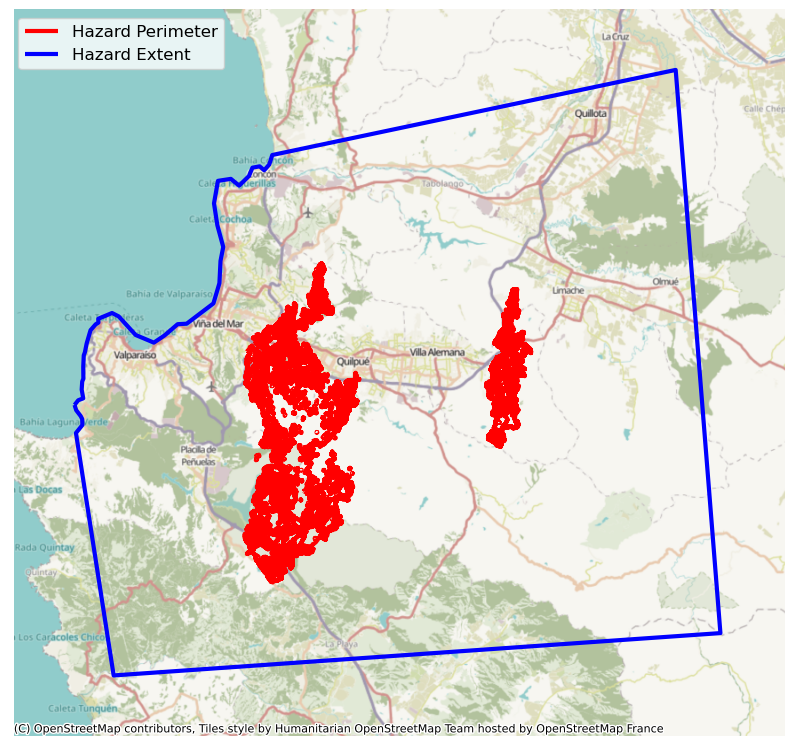

In [ ]:
# import contextily as ctx

# fig, ax = plt.subplots(figsize=(10, 10))

# df_perim.boundary.plot(ax=ax, color='red', alpha=1, lw=3, label='Hazard Perimeter')
# df_extent.boundary.plot(ax=ax, color='blue', alpha=1, lw=3, label='Hazard Extent')
# ctx.add_basemap(ax, crs=df_perim.crs)

# xmin, ymin, xmax, ymax = df_extent.total_bounds
# x_buffer = (xmax - xmin) * 0.1
# y_buffer = (ymax - ymin) * 0.1
# ax.set_xlim(xmin - x_buffer, xmax + x_buffer)
# ax.set_ylim(ymin - y_buffer, ymax + y_buffer)
# ax.axis('off')
# ax.legend(loc='upper left', fontsize=12)
